In [10]:
from scipy.stats import ttest_ind, mannwhitneyu
from scipy.stats import shapiro
import sys
# sys.modules.pop("mlmarker", None)

import mlmarker
# print(mlmarker.__file__)
# import mlmarker.model as MLMarker
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")
pd.options.mode.chained_assignment = None

import tqdm
sys.path.append('/home/compomics/git/Projects/MLMarker_paper')
from MLMarker_reprocessing_quant import *

import umap
import sys
sys.setrecursionlimit(10000)
plt.figure(figsize=(20,20))

import dash_bio

import bioservices
from bioservices import UniProt
u = UniProt()
translated_genes_path = '/home/compomics/git/Projects/MLMarker_paper/PXD007592_responders_melanoma/translated_genes.txt'

with open(translated_genes_path, "r") as f:
    translated_genes = dict(line.strip().split("\t") for line in f if line.strip())
model = mlmarker.MLMarker(binary=False, dev=True)
features = model.get_model_features()


Trying to unpickle estimator DecisionTreeClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations


<Figure size 2000x2000 with 0 Axes>

In [2]:
def get_go_enrichment(protein_list):

    # Initialize g:Profiler
    gp = GProfiler(return_dataframe=True)

    # Dictionary to store GO terms and p-values for each tissue
    go_dict = {}


    # Perform GO enrichment
    results = gp.profile(organism='hsapiens', query=protein_list, sources=['GO:BP', 'GO:MF', 'GO:CC', 'HPA', 'KEGG'])
    #p_values contains a list of floats, get the first element
    results = results[results['p_value']< 0.01]
    # Store results in the dictionary: {tissue: {GO_term: p-value}}
    return results
from plotly.subplots import make_subplots
from gprofiler import GProfiler
import plotly.graph_objects as go


def visualise_go_enrichment(df,  title, proteins, max_bars=20,):
    # Add a -log10(p-value) column for better visualization of significance
    df['-log10(p_value)'] = -np.log10(df['p_value'])

    # Sort the data by -log10(p_value) for ranking from high to low
    df_sorted = df.sort_values(by="-log10(p_value)", ascending=False)

    # Get the unique source types (e.g., 'GO:CC', 'GO:BP', 'HPA')
    sources = sorted(df_sorted['source'].unique())
    print(sources)
    max_log_p_value = df_sorted['-log10(p_value)'].max()
    # Create subplots: 2 rows and 2 columns
    fig = make_subplots(
        rows=1, cols=len(sources),  # 1 row, 4 columns
        subplot_titles=sources,  # Titles for each subplot (based on source)
        shared_yaxes=False  # Share y-axis to make comparison easier
    )

    # Loop over each source and add a bar trace
    for i, source in enumerate(sources, start=1):
        source_df = df_sorted[df_sorted['source'] == source]
        source_df = source_df.head(max_bars)
        # Create the bar trace for this source
        trace = go.Bar(
            x=source_df['-log10(p_value)'],
            y=source_df['name'],
            orientation='h',
            name=source,
            hoverinfo='x+y',
            marker=dict(opacity=0.8, line=dict(width=1, color='DarkSlateGrey'))
        )
        
        # Add the trace to the corresponding subplot
        fig.add_trace(trace, row=1, col=i)

    # Update layout
    fig.update_layout(
        template="plotly_white",
        title=f"{title} GO Enrichment Term Rank (Max 20 bars) for {proteins} proteins",
        title_x=0.5,
        xaxis_title="-log10(p-value)",
        yaxis_title="GO Terms",
        height=600,
        width=3000,
        showlegend=False,
        xaxis=dict(range=[0, max_log_p_value]),  # Set the same range for all subplots
        xaxis2=dict(range=[0, max_log_p_value]),
        xaxis3=dict(range=[0, max_log_p_value]),
        xaxis4=dict(range=[0, max_log_p_value]),
    )
    # Show the plot
    fig.show()
    return fig

In [3]:
def translate_gene2prot(genelist):
    translated = {}
    manual_map = []
    for g in tqdm.tqdm(genelist):
        # check if u.retrieve returns not a warning
        response = u.retrieve(g)
        if isinstance(response, dict):
            if 'primaryAccession' in response:
                protid = response['primaryAccession']
                translated[g] = protid
        elif isinstance(response, int):
            manual_map.append(g)
        elif response.get('status_code') == 400 or 'warning' in response.text:
            manual_map.append(g)
            continue
        else:
            manual_map.append(g)
    return translated

In [16]:
#remove mlmarker features from quantified peptides to prevent circularity and double dipping
df = pd.read_csv('QuantifiedPeptides.tsv', sep='\t')    
df.head()
genes = df['Protein Groups'].unique()
translated_genes = translate_gene2prot(genes)
#save as txt
with open('translated_genes.txt', 'w') as f:
    for gene, protid in translated_genes.items():
        f.write(f"{gene}\t{protid}\n")

 29%|██▊       | 2131/7451 [07:36<26:24,  3.36it/s]  WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
 31%|███       | 2319/7451 [08:15<17:42,  4.83it/s]WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
 68%|██████▊   | 5088/7451 [17:55<08:42,  4.53it/s]WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
 84%|████████▍ | 6245/7451 [21:57<04:16,  4.71it/s]WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
WARNING [bioservices.UniProt:596]:  status is not ok with Bad Request
100%|██████████| 7451/7451 [26:08<00:00,  4.75it/s]


In [7]:
translated_genes_path = '/home/compomics/git/Projects/MLMarker_paper/PXD007592_responders_melanoma/translated_genes.txt'

with open(translated_genes_path, "r") as f:
    translated_genes = dict(line.strip().split("\t") for line in f if line.strip())

In [5]:
#remove mlmarker features from quantified peptides to prevent circularity and double dipping
df = pd.read_csv('QuantifiedPeptides.tsv', sep='\t')    
df.head()
genes = df['Protein Groups'].unique()
translated_genes = translate_gene2prot(genes)
#save as txt
with open('translated_genes.txt', 'r') as f:
    for gene, protid in translated_genes.items():
        f.write(f"{gene}\t{protid}\n")

  5%|▌         | 408/7451 [01:25<24:36,  4.77it/s]


KeyboardInterrupt: 

In [4]:
to_drop = []
for k,v in translated_genes.items():
    if v in features:
        to_drop.append(k)
df =df[~df['Protein Groups'].isin(to_drop)]
df.to_csv('QuantifiedPeptidesNotMLMarker.tsv', sep='\t')

NameError: name 'translated_genes' is not defined

In [8]:
prot = pd.read_csv('QuantifiedPeptidesNotMLMarker.tsv', sep='\t')

In [42]:
df = pd.read_csv("/home/compomics/git/Projects/MLMarker_paper/PXD007592_responders_melanoma/prediction_volcano_data_sample_typenot_brain.csv")
df

,Protein.Groups,logFC,pval,adjPval,negLogAdjPval,significant
0,1433B_HUMAN,-1.531729,0.000001,0.000388,3.410657,True
1,1433B_HUMAN;1433E_HUMAN;1433F_HUMAN;1433G_HUMA...,-0.792940,0.014159,0.076110,1.118559,False
2,1433B_HUMAN;1433G_HUMAN,0.442197,0.493165,0.661950,0.179175,False
3,1433E_HUMAN,-1.308899,0.000075,0.002821,2.549591,True
4,1433F_HUMAN,-1.682075,0.000927,0.014149,1.849263,False
...,...,...,...,...,...,...
4462,ZO2_HUMAN,0.566811,0.029712,0.117787,0.928904,False
4463,ZPR1_HUMAN,-1.579873,0.003995,0.034968,1.456327,False
4464,ZW10_HUMAN,-0.730582,0.001662,0.020279,1.692949,False
4465,ZY11B_HUMAN,0.242634,0.666710,0.798743,0.097593,False


In [9]:
df = pd.read_csv("/home/compomics/git/Projects/MLMarker_paper/PXD007592_responders_melanoma/prediction_volcano_data_sample_typenot_brain.csv")
df["Protein.Groups"] = df["Protein.Groups"].str.split(';').str[0]
df.set_index('Protein.Groups', inplace=True)
df.dropna(how='all', inplace=True)
df.fillna(0, inplace=True)

#set columns astype float
df["sample_typenot_brain.logFC"] = df["logFC"].astype(float)
df["sample_typenot_brain.adjPval"] = df["adjPval"].astype(float)

pval_cutoff = 0.01
logfc_cutoff = -0.5

overexpressed_brain = df[(df["sample_typenot_brain.adjPval"] < pval_cutoff)&(df["sample_typenot_brain.logFC"]< logfc_cutoff)].index.values.tolist()
overexpressed_notbrain = df[(df["sample_typenot_brain.adjPval"]< pval_cutoff)&(df["sample_typenot_brain.logFC"]> abs(logfc_cutoff))].index.values.tolist()
print(len(overexpressed_brain), len(overexpressed_notbrain))

godf1 = get_go_enrichment(list(translate_gene2prot(overexpressed_brain).values()))
f1 = visualise_go_enrichment(godf1, "Brain", len(overexpressed_brain))
f1.write_image(f'/home/compomics/git/Projects/MLMarker_paper/Figures_paper/enrich_overexpressedbrain.png', scale=2)

godf2 = get_go_enrichment(list(translate_gene2prot(overexpressed_notbrain).values()))
f2 = visualise_go_enrichment(godf2, "Not Brain", len(overexpressed_notbrain))
f2.write_image(f'/home/compomics/git/Projects/MLMarker_paper/Figures_paper/enrich_overexpressed_notbrain.png', scale=2)


207 34


  6%|▌         | 12/207 [00:02<00:42,  4.59it/s]

100%|██████████| 207/207 [00:43<00:00,  4.72it/s]


['GO:BP', 'GO:CC', 'GO:MF', 'HPA', 'KEGG']


100%|██████████| 34/34 [00:07<00:00,  4.54it/s]


['GO:BP', 'GO:CC', 'GO:MF', 'HPA', 'KEGG']


In [10]:
original_up_poor = ["Q14232", "Q14152", "P55884", "O00303", "O75821", "Q13347", "Q9UBQ5", "Q9Y262", "P23588", "Q15056", "O60841", "Q8N111", "P51674", "P62166", "Q7Z3B1", "Q15818", "Q92823", "Q9UH03", "P17600", "Q92777", "O14994", "P30531", "P43003", "P43004", "P43007", "P48066", "Q15043", "Q6PML9", "Q8N4V1", "Q8TBB6", "Q96QE2", "Q99726", "Q9H1V8", "Q9NS82", "P32418", "Q8TCU6", "Q92581", "Q9UPR5", "Q15904", "Q93050", "P27449", "P61421", "P38606", "P21281", "P21283", "Q9Y5K8", "P36543", "Q16864", "O75348", "O95670", "Q9UI12", "P28482", "P53779", "P27361", "Q9UPT6", "O00533", "O15394", "P13591", "P32004", "Q14982", "Q14CZ8", "Q8N3J6", "Q8NFZ8", "Q92823", "P62158", "Q14012", "Q9UQM7", "Q13554", "Q13555", "Q16566", "Q8N5S9", "Q96RR4", "Q9P1Y5", "P54750", "Q01064", "EMT", 'P19022']
original_up_good = ["P05164", "P01909", "P04233", "P20039", "Q95365", "Q5Y7A7", "P01594", "P01609", "P01613", "P01617", "P01623", "P01777", "P01767", "P01779", "P01834", "P01857", "P01860", "P01871", "P01876", "P01880", "O14791", "P02647", "P04114", "P06727", "P16284", "P31997", "P40199", "P02452", "P02751", "P08123", "P25067", "P39059", "Q05707", "Q96P44"]
invasion_markers = ['1433E','1433Z','ACLY','ACTN4','AL1A1','ANXA1','ANXA2','ANXA6','APMAP','ATPA','ATPD','BGH3','BIP','CADH1','CALR','CALX','CATD','CD166','CLUS','CO1A2','COF1','COIA1','COX5A','DPYL3','ECM1','EZRI','FAS','FETUA','FIBG','FINC','FLNA','FSCN1','GELS','GRP75','GSTP1','H4','HS90A','HSPB1','ITGB1','K1C10','K1C18','K2C8','KPYM','LEG1','LEG3','LMNA','LUM','MMP2','MMP9','MYH9','NID1','NPM','PAI1','PCNA','PDIA4','PDIA6','PHB','PHB2','POSTN','PRDX1','PRDX2','PROF1','RAN','S10A4','S10A6','SERPH','SSBP','STMN1','TAGL','TENA','TGM2','TPIS','TPM2','TSP1','VIME','VINC']

In [11]:
len(invasion_markers)

76

In [12]:
identified_markers = set([protein.replace("_HUMAN", "") for protein in overexpressed_brain]).intersection(set(invasion_markers))

Correlation shap and DEA

In [23]:
pxd = "PXD007592"
base_path = f"/home/compomics/conode*/PRIDE_DATA"  
lengths_path = "/home/compomics/git/Projects/MLMarker_paper/uniprot_reviewed_lengths.tsv"
prot_mlmarker_df, unique_protein_dict = get_mlmarker_dataframe(pxd, base_path, lengths_path, dev=True, tissue_level=False)
prot_mlmarker_df['disease_status'] = prot_mlmarker_df['filename'].str.split('_').str[0]
shap_df = prot_mlmarker_df.reset_index()[['index', 'Brain', 'filename', 'Predicted']].pivot_table(index=['Predicted'], columns='index', values='Brain', aggfunc='mean')

/home/compomics/miniconda3/envs/mlmarker/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/home/compomics/miniconda3/envs/mlmarker/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator RandomForestClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/home/compomics/miniconda3/envs/mlmarker/lib/python3.10/site-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeClassif

In [24]:
metadata = pd.read_csv('metadata.csv')
metadata['file'] = metadata['Filename'].str.split(' ').str[1]
#map Predicted from metadata to new column in prot_mlmarker_df based on filename
prot_mlmarker_df['Predicted'] = prot_mlmarker_df['filename'].map(metadata.set_index('file')['Predicted'])

In [43]:
df

,Protein.Groups,logFC,pval,adjPval,negLogAdjPval,significant
0,1433B_HUMAN,-1.531729,0.000001,0.000388,3.410657,True
1,1433B_HUMAN;1433E_HUMAN;1433F_HUMAN;1433G_HUMA...,-0.792940,0.014159,0.076110,1.118559,False
2,1433B_HUMAN;1433G_HUMAN,0.442197,0.493165,0.661950,0.179175,False
3,1433E_HUMAN,-1.308899,0.000075,0.002821,2.549591,True
4,1433F_HUMAN,-1.682075,0.000927,0.014149,1.849263,False
...,...,...,...,...,...,...
4462,ZO2_HUMAN,0.566811,0.029712,0.117787,0.928904,False
4463,ZPR1_HUMAN,-1.579873,0.003995,0.034968,1.456327,False
4464,ZW10_HUMAN,-0.730582,0.001662,0.020279,1.692949,False
4465,ZY11B_HUMAN,0.242634,0.666710,0.798743,0.097593,False


In [44]:
shap_df = prot_mlmarker_df.reset_index()[['index', 'Brain', 'filename', 'Predicted']].pivot_table(index=['Predicted'], columns='index', values='Brain', aggfunc='mean')
# shap_df = shap_df.loc[:, (shap_df != 0).any(axis=0)]
upregulated_notbrain = df[(df['logFC'] > 1)&(df['adjPval']<= 1)].reset_index()
upregulated_brain = df[(df['logFC'] < -1)&(df['adjPval']<= 1)].reset_index()
#map from translated_genes
upregulated_notbrain['protein'] = upregulated_notbrain['Protein.Groups'].map(translated_genes)
upregulated_brain['protein'] = upregulated_brain['Protein.Groups'].map(translated_genes)


upregulated_notbrain = upregulated_notbrain[['protein', 'adjPval']]
upregulated_brain = upregulated_brain[['protein', 'adjPval']]

upregulated_brain = upregulated_brain.set_index('protein')
upregulated_notbrain = upregulated_notbrain.set_index('protein')
upregulated_brain = upregulated_brain[~upregulated_brain.index.isna()]
upregulated_notbrain = upregulated_notbrain[~upregulated_notbrain.index.isna()]


#if columns with duplicate name, merge them and take the mean
# upregulated_brain = upregulated_brain.groupby(level=0).mean().T
# upregulated_notbrain = upregulated_notbrain.groupby(level=0).mean().T


In [45]:
upregulated_brain.columns = ['adj_pval_upregulatedinbrain']
upregulated_notbrain.columns = ['adj_pval_upregulatedinnotbrain']
upregulated_brain = upregulated_brain.groupby(upregulated_brain.index).mean()
upregulated_notbrain = upregulated_notbrain.groupby(upregulated_notbrain.index).mean()

regulated = pd.concat(
    [upregulated_brain, upregulated_notbrain],
    axis=1,
    join="outer"
)


print(upregulated_brain.shape, upregulated_notbrain.shape, regulated.shape)
comparison_df = pd.merge(regulated, shap_df.T, left_index=True, right_index=True, how='outer')
comparison_df.replace(0.000000, np.nan, inplace=True)
comparison_df.shape

(501, 1) (174, 1) (671, 2)


(6232, 4)

In [46]:
comparison_df.columns=['SHAP_brainpredicted', 'SHAP_notbrainpredicted', 'adj_pval_upregulatedinbrain', 'adj_pval_upregulatedinnotbrain']
comparison_df = comparison_df.fillna(np.nan)
comparison_df['max_shap_abs'] = comparison_df[["SHAP_brainpredicted","SHAP_notbrainpredicted"]].abs().max(axis=1)
comparison_df['min_pval_abs'] = comparison_df[["adj_pval_upregulatedinbrain","adj_pval_upregulatedinnotbrain"]].abs().min(axis=1)
epsilon = 1e-10  # small constant to avoid division by zero
comparison_df['log_max_shap_abs'] = -np.log10(comparison_df['max_shap_abs'] + epsilon)
comparison_df['log_min_pval_abs'] = -np.log10(comparison_df['min_pval_abs'] + epsilon)


(165, 8)


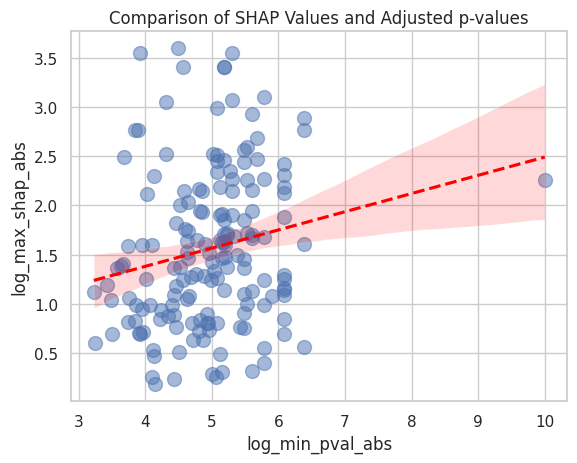

Spearman rho = 0.232, p = 0.0027
Kendall's tau = 0.158, p-value = 0.00272
Pearson correlation coefficient = 0.197, p-value = 0.0114
T-statistic = 71.645, p-value = 2.22e-202
Mann-Whitney U statistic = 27225.000, p-value = 1.32e-55


In [47]:
plot_comparison = comparison_df[(~comparison_df['log_max_shap_abs'].isnull())&(~comparison_df['log_min_pval_abs'].isnull())]

print(plot_comparison.shape)
plt.scatter(y=plot_comparison['log_max_shap_abs'], x=plot_comparison['log_min_pval_abs'], alpha=0.5, s=100)
plt.ylabel('Log max Absolute SHAP Value')
plt.xlabel('Log min absolute adjusted p-value')
#draw a regression line
sns.regplot(x='log_min_pval_abs', y='log_max_shap_abs', data=plot_comparison, scatter=False, fit_reg=True, color='red', line_kws={'linestyle': '--'})
plt.title('Comparison of SHAP Values and Adjusted p-values')
plt.show()


from scipy.stats import spearmanr
rho, pval = spearmanr(plot_comparison['log_min_pval_abs'], plot_comparison['log_max_shap_abs'])
print(f"Spearman rho = {rho:.3f}, p = {pval:.3g}")

#calculate kendalls tau
from scipy.stats import kendalltau
tau, pval = kendalltau(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Kendall's tau = {tau:.3f}, p-value = {pval:.3g}")
#pearson correlation
from scipy.stats import pearsonr
pearson_corr, pearson_pval = pearsonr(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Pearson correlation coefficient = {pearson_corr:.3f}, p-value = {pearson_pval:.3g}")
# Perform t-test
t_stat, t_pval = ttest_ind(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"T-statistic = {t_stat:.3f}, p-value = {t_pval:.3g}")
# Perform Mann-Whitney U test
u_stat, u_pval = mannwhitneyu(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Mann-Whitney U statistic = {u_stat:.3f}, p-value = {u_pval:.3g}")

(165, 8)


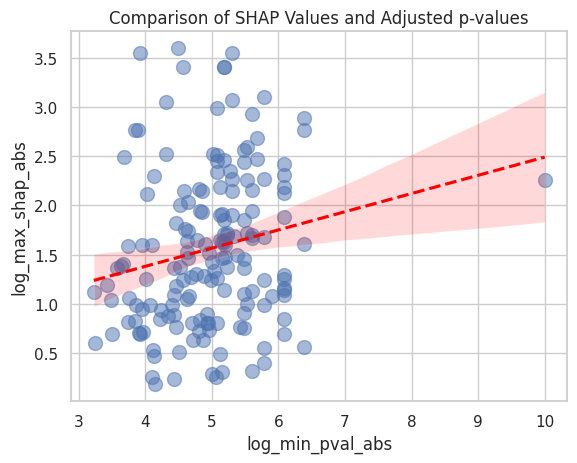

Spearman rho = 0.232, p = 0.0027
Kendall's tau = 0.158, p-value = 0.00272
Pearson correlation coefficient = 0.197, p-value = 0.0114
T-statistic = 71.645, p-value = 2.22e-202
Mann-Whitney U statistic = 27225.000, p-value = 1.32e-55


In [ ]:
plot_comparison = comparison_df[(~comparison_df['log_max_shap_abs'].isnull())&(~comparison_df['log_min_pval_abs'].isnull())]

print(plot_comparison.shape)
plt.scatter(y=plot_comparison['log_max_shap_abs'], x=plot_comparison['log_min_pval_abs'], alpha=0.5, s=100)
plt.ylabel('Log max Absolute SHAP Value')
plt.xlabel('Log min absolute adjusted p-value')
#draw a regression line
sns.regplot(x='log_min_pval_abs', y='log_max_shap_abs', data=plot_comparison, scatter=False, fit_reg=True, color='red', line_kws={'linestyle': '--'})
plt.title('Comparison of SHAP Values and Adjusted p-values')
plt.show()


from scipy.stats import spearmanr
rho, pval = spearmanr(plot_comparison['log_min_pval_abs'], plot_comparison['log_max_shap_abs'])
print(f"Spearman rho = {rho:.3f}, p = {pval:.3g}")

#calculate kendalls tau
from scipy.stats import kendalltau
tau, pval = kendalltau(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Kendall's tau = {tau:.3f}, p-value = {pval:.3g}")
#pearson correlation
from scipy.stats import pearsonr
pearson_corr, pearson_pval = pearsonr(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Pearson correlation coefficient = {pearson_corr:.3f}, p-value = {pearson_pval:.3g}")
# Perform t-test
t_stat, t_pval = ttest_ind(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"T-statistic = {t_stat:.3f}, p-value = {t_pval:.3g}")
# Perform Mann-Whitney U test
u_stat, u_pval = mannwhitneyu(plot_comparison['log_min_pval_abs'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Mann-Whitney U statistic = {u_stat:.3f}, p-value = {u_pval:.3g}")

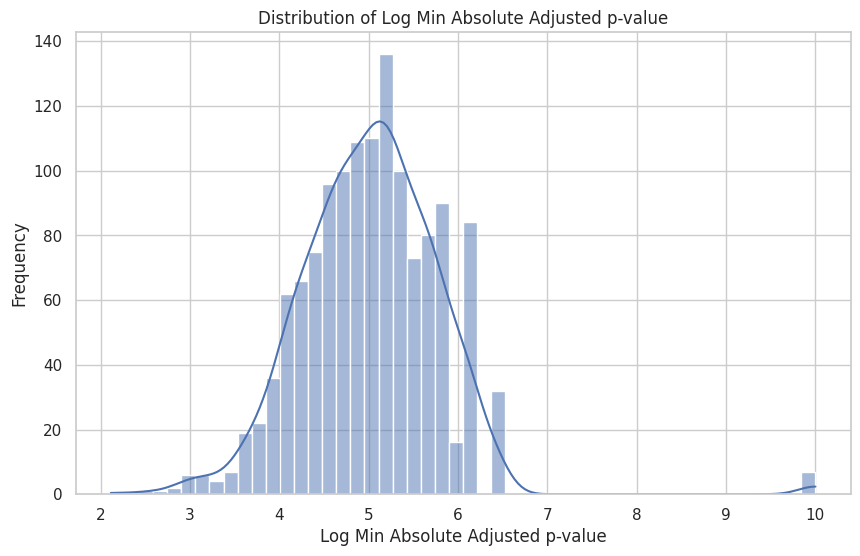

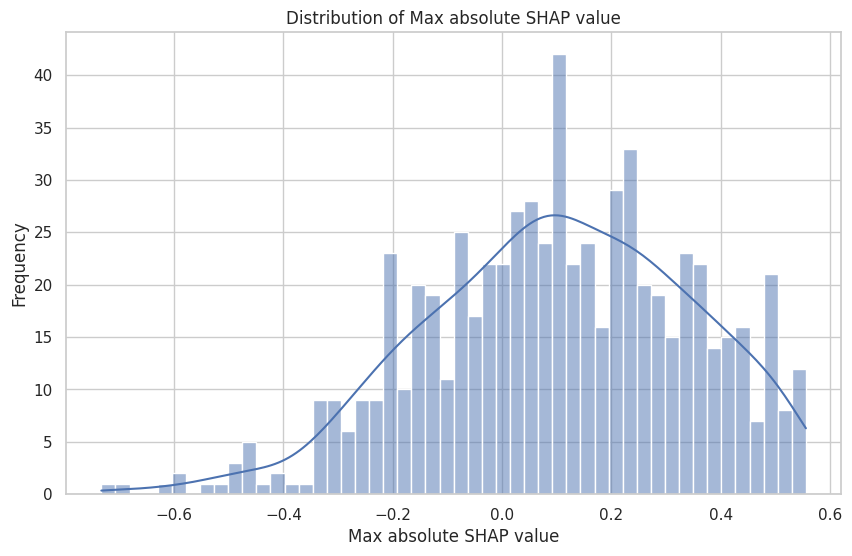

In [165]:
#distribution of log_min_abs
plt.figure(figsize=(10, 6))
sns.histplot(comparison_df['log_min_pval_abs'], bins=50, kde=True)
plt.title('Distribution of Log Min Absolute Adjusted p-value')
plt.xlabel('Log Min Absolute Adjusted p-value')
plt.ylabel('Frequency')
plt.show()

#distribution of max_abs
plt.figure(figsize=(10, 6))
sns.histplot(np.log10(comparison_df['log_max_shap_abs']), bins=50, kde=True)
plt.title('Distribution of Max absolute SHAP value')
plt.xlabel('Max absolute SHAP value')
plt.ylabel('Frequency')
plt.show()

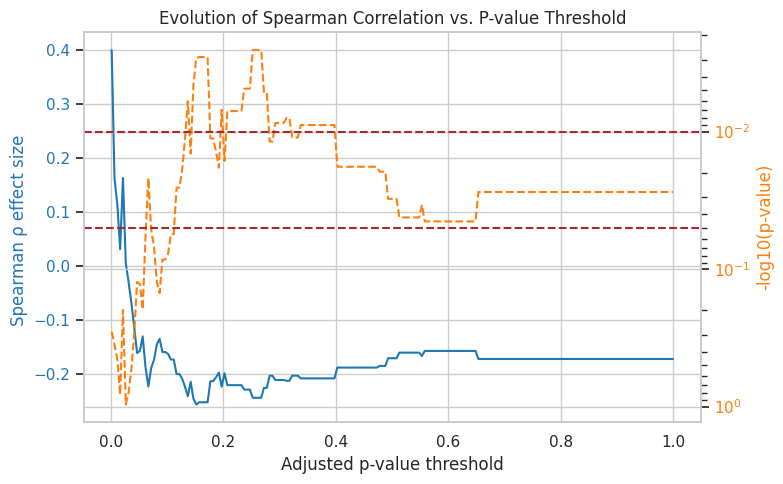

In [20]:
import numpy as np
import pandas as pd
from scipy.stats import spearmanr
import matplotlib.pyplot as plt

# Define thresholds
thresholds = np.linspace(0.001, 1.0, 200)

rhos = []
pvals = []

for thresh in thresholds:
    subset = comparison_df[comparison_df['min_abs'] <= thresh]
    if len(subset) > 2:  # Need at least 3 data points for Spearman
        rho, p = spearmanr(subset['log_min_abs'], subset['max_abs'])
        rhos.append(rho)
        pvals.append(p)
    else:
        rhos.append(np.nan)
        pvals.append(np.nan)

# Plot
fig, ax1 = plt.subplots(figsize=(8, 5))

color = 'tab:blue'
ax1.set_xlabel('Adjusted p-value threshold')
ax1.set_ylabel('Spearman ρ effect size ', color=color)
ax1.plot(thresholds, rhos, color=color, label='Spearman ρ')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:orange'
ax2.set_ylabel('-log10(p-value)', color=color)
ax2.plot(thresholds, pvals, color=color, linestyle='--', label='p-value')
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_yscale('log')  # Log scale for p-values
#invert the yaxis
ax2.invert_yaxis()

#draw a horizontal line at 0.01 and 0.05
ax2.axhline(y=0.01, color='brown', linestyle='--', label='p = 0.01')
ax2.axhline(y=0.05, color='brown', linestyle='--', label='p = 0.05')

#add legend for horizontal lines

plt.title('Evolution of Spearman Correlation vs. P-value Threshold')
plt.tight_layout()
plt.show()


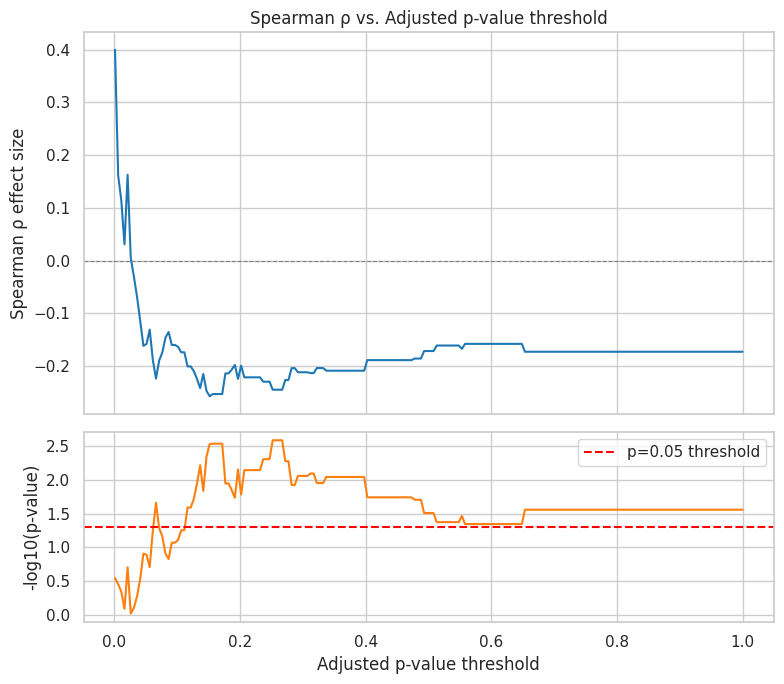

In [21]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming thresholds, rhos, and pvals are defined as in your code

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(8, 7), gridspec_kw={'height_ratios':[2,1]})


# Spearman rho plot
ax1.plot(thresholds, rhos, color='tab:blue')
ax1.set_ylabel('Spearman ρ effect size')
ax1.axhline(0, color='gray', linestyle='--', linewidth=0.8)
ax1.set_title('Spearman ρ vs. Adjusted p-value threshold')

# p-value plot (-log10 scale)
neg_log_pvals = -np.log10(pvals)
ax2.plot(thresholds, neg_log_pvals, color='tab:orange')
ax2.set_ylabel('-log10(p-value)')
ax2.set_xlabel('Adjusted p-value threshold')
ax2.axhline(-np.log10(0.05), color='red', linestyle='--', label='p=0.05 threshold')
ax2.legend()

plt.tight_layout()
plt.show()



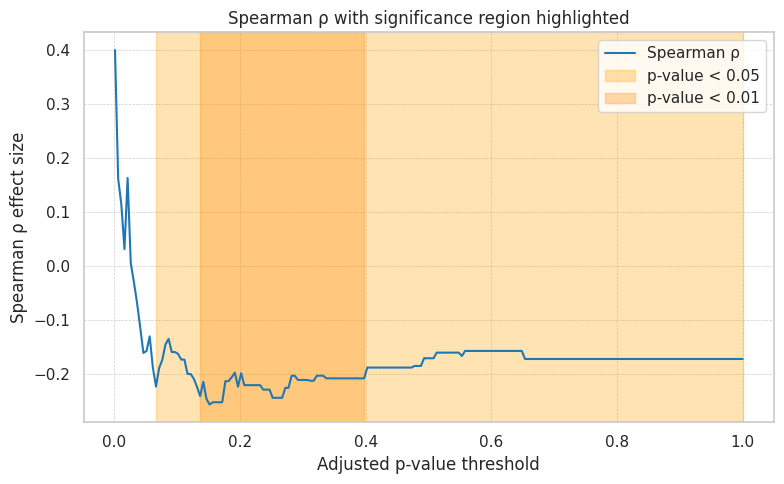

In [22]:
import numpy as np
import matplotlib.pyplot as plt

# Prepare pvals to avoid log(0)
pvals_clean = np.array(pvals)
pvals_clean[pvals_clean <= 1e-300] = 1e-300

fig, ax = plt.subplots(figsize=(8, 5))

# Plot Spearman rho
ax.plot(thresholds, rhos, color='tab:blue', label='Spearman ρ')

# Shade region where p-value < 0.05
signif_region = thresholds[pvals_clean < 0.05]
if len(signif_region) > 0:
    ax.axvspan(signif_region.min(), signif_region.max(), color='orange', alpha=0.3, label='p-value < 0.05')


signif_region2 = thresholds[pvals_clean < 0.01]
if len(signif_region2) > 0:
    ax.axvspan(signif_region2.min(), signif_region2.max(), color='darkorange', alpha=0.3, label='p-value < 0.01')

ax.set_xlabel('Adjusted p-value threshold')
ax.set_ylabel('Spearman ρ effect size')
ax.set_title('Spearman ρ with significance region highlighted')
ax.legend()
ax.grid(True, which="both", ls="--", linewidth=0.5)

plt.tight_layout()
plt.show()


In [ ]:
plt.scatter(x['P-values'])

In [79]:
upregulated_notbrain = df[(df['sample_typenot_brain.logFC'] > 1) & (df['sample_typenot_brain.adjPval'] <= 0.8)].reset_index()
upregulated_brain = df[(df['sample_typenot_brain.logFC'] < -1) & (df['sample_typenot_brain.adjPval'] <= 0.8)].reset_index()

# Map to protein names
upregulated_notbrain['protein'] = upregulated_notbrain['Protein.Groups'].map(translated_genes)
upregulated_brain['protein'] = upregulated_brain['Protein.Groups'].map(translated_genes)

# Keep only relevant columns
upregulated_notbrain = upregulated_notbrain[['protein', 'sample_typenot_brain.adjPval']]
upregulated_brain = upregulated_brain[['protein', 'sample_typenot_brain.adjPval']]

# Set protein as index and merge duplicates by averaging
upregulated_brain = upregulated_brain.set_index('protein').groupby(level=0).mean().T
upregulated_notbrain = upregulated_notbrain.set_index('protein').groupby(level=0).mean().T

# Merge with SHAP values
comparison_df = shap_df.T.merge(upregulated_brain.T, left_index=True, right_index=True, how='inner')
comparison_df = comparison_df.merge(upregulated_notbrain.T, left_index=True, right_index=True, how='inner')
comparison_df.columns = ['SHAP_brainpredicted', 'SHAP_notbrainpredicted', 'adj_pval_upregulatedinbrain', 'adj_pval_upregulatedinnotbrain']
# comparison_df = comparison_df.fillna(np.nan)
comparison_df

ValueError: Length mismatch: Expected axis has 6 elements, new values have 4 elements

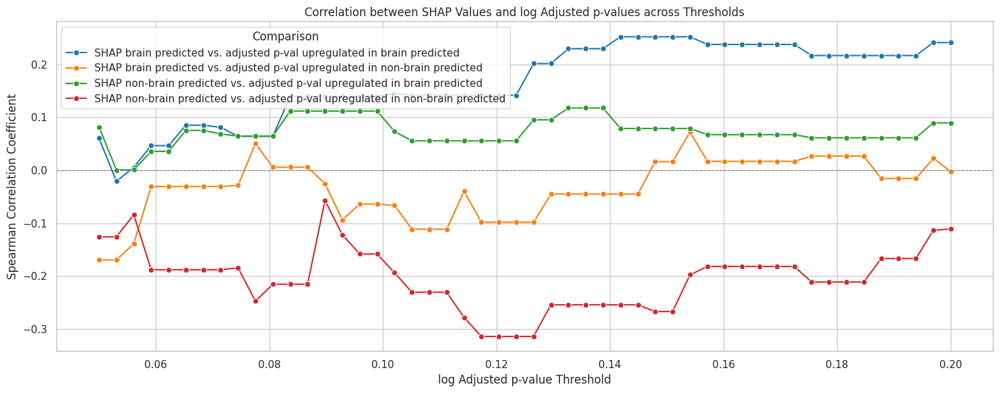

/tmp/ipykernel_122654/2910819673.py:69: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




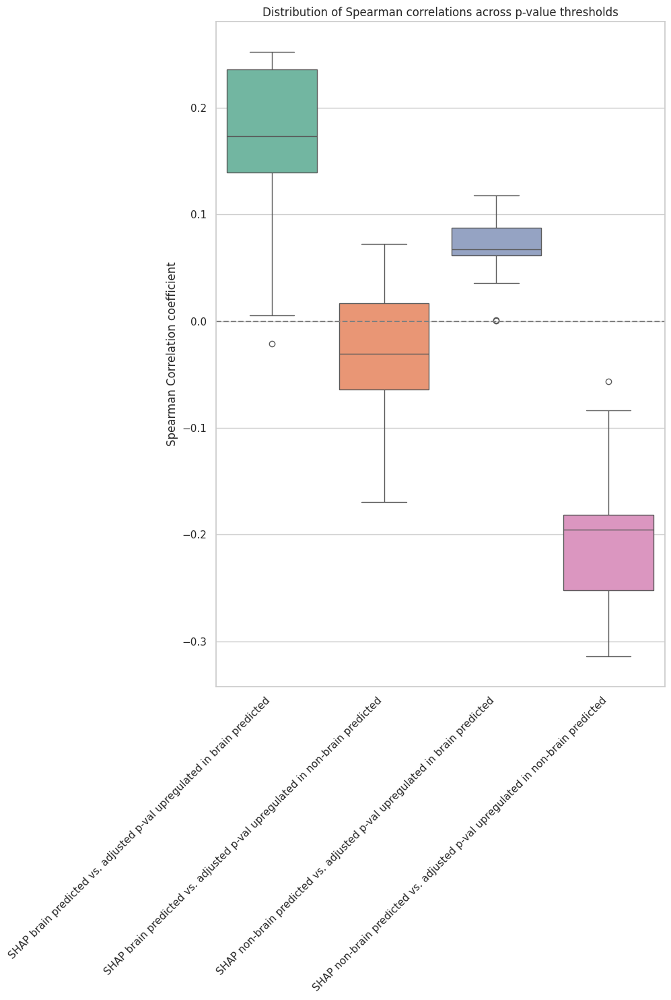

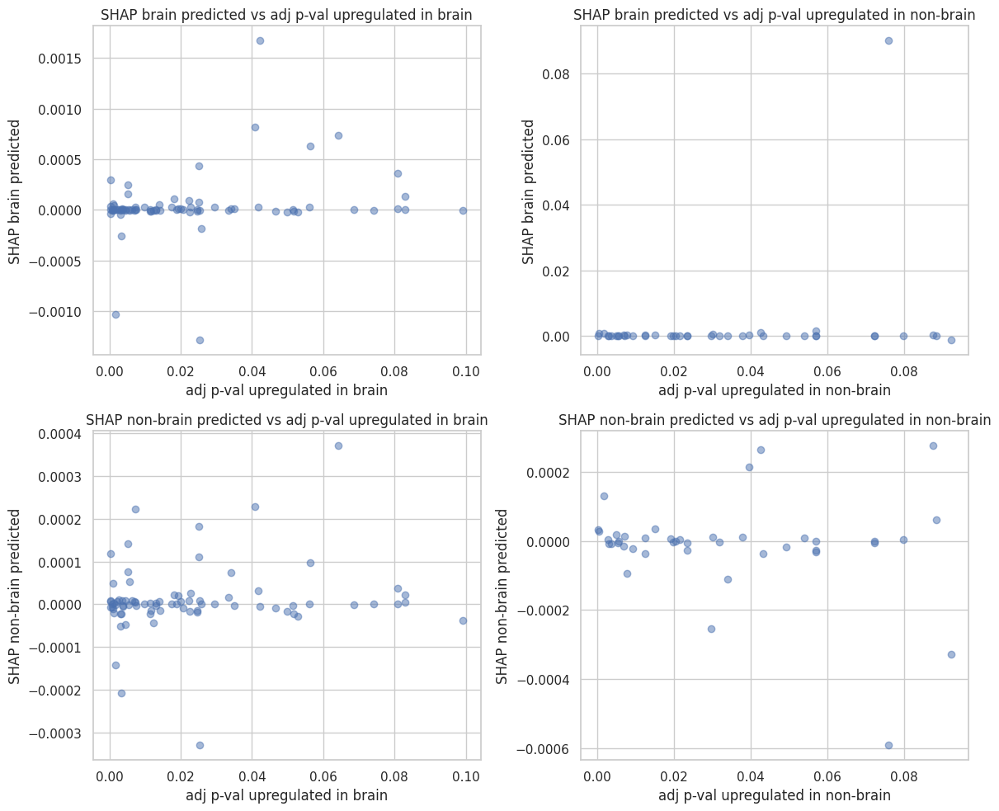

In [44]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


pval_thresholds = np.linspace(0.05, 0.8, 50)

corr_results = {
    'Threshold': [],
    'Comparison': [],
    'Correlation': []
}

for pval_thresh in pval_thresholds:
    upregulated_notbrain = df[(df['sample_typenot_brain.logFC'] > 1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()
    upregulated_brain = df[(df['sample_typenot_brain.logFC'] < -1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()

    upregulated_notbrain['protein'] = upregulated_notbrain['Protein.Groups'].map(translated_genes)
    upregulated_brain['protein'] = upregulated_brain['Protein.Groups'].map(translated_genes)

    upregulated_notbrain = upregulated_notbrain[['protein', 'sample_typenot_brain.adjPval']]
    upregulated_brain = upregulated_brain[['protein', 'sample_typenot_brain.adjPval']]

    upregulated_brain = upregulated_brain.set_index('protein').groupby(level=0).mean().T
    upregulated_notbrain = upregulated_notbrain.set_index('protein').groupby(level=0).mean().T

    comparison_df = shap_df.T.merge(upregulated_brain.T, left_index=True, right_index=True, how='outer')
    comparison_df = comparison_df.merge(upregulated_notbrain.T, left_index=True, right_index=True, how='outer')
    comparison_df.columns = ['SHAP_brainpredicted', 'SHAP_notbrainpredicted', 'adj_pval_upregulatedinbrain', 'adj_pval_upregulatedinnotbrain']
    comparison_df['log_adj_pval_upregulatedinbrain'] = -np.log10(comparison_df['adj_pval_upregulatedinbrain'] + 1e-10)
    comparison_df['log_adj_pval_upregulatedinnotbrain'] = -np.log10(comparison_df['adj_pval_upregulatedinnotbrain'] + 1e-10)

    comparison_df = comparison_df.fillna(np.nan)

    corr_matrix = comparison_df.corr(method='spearman')

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP brain predicted vs. log adjusted p-val upregulated in brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_brainpredicted', 'log_adj_pval_upregulatedinbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP brain predicted vs. log adjusted p-val upregulated in non-brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_brainpredicted', 'log_adj_pval_upregulatedinnotbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP non-brain predicted vs. log adjusted p-val upregulated in brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_notbrainpredicted', 'log_adj_pval_upregulatedinbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP non-brain predicted vs. log adjusted p-val upregulated in non-brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_notbrainpredicted', 'log_adj_pval_upregulatedinnotbrain'])



# 1. Lijnplot correlaties over thresholds
plt.figure(figsize=(15, 6))
sns.lineplot(data=corr_df, x='Threshold', y='Correlation', hue='Comparison', marker='o', palette="tab10")
plt.xlabel('log Adjusted p-value Threshold')
plt.ylabel('Spearman Correlation Coefficient')
plt.title('Correlation between SHAP Values and log Adjusted p-values across Thresholds')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)
plt.grid(True)
plt.tight_layout()
plt.show()

# 2. Boxplot van correlatie-distributies per vergelijking
plt.figure(figsize=(10,15))
sns.boxplot(data=corr_df, x='Comparison', y='Correlation', palette='Set2')
plt.xticks(rotation=45, ha='right')
plt.axhline(0, color='gray', linestyle='--')
plt.title('Distribution of Spearman correlations across p-value thresholds')
plt.ylabel('Spearman Correlation coefficient')
plt.xlabel('')
plt.tight_layout()
plt.show()

# 3. Scatterplots voor één p-waarde drempel (bv. 0.1)
pval_thresh = 0.1

# Herbouw comparison_df met gekozen drempel
upregulated_notbrain = df[(df['sample_typenot_brain.logFC'] > 1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()
upregulated_brain = df[(df['sample_typenot_brain.logFC'] < -1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()

upregulated_notbrain['protein'] = upregulated_notbrain['Protein.Groups'].map(translated_genes)
upregulated_brain['protein'] = upregulated_brain['Protein.Groups'].map(translated_genes)

upregulated_notbrain = upregulated_notbrain[['protein', 'sample_typenot_brain.adjPval']]
upregulated_brain = upregulated_brain[['protein', 'sample_typenot_brain.adjPval']]

upregulated_brain = upregulated_brain.set_index('protein').groupby(level=0).mean().T
upregulated_notbrain = upregulated_notbrain.set_index('protein').groupby(level=0).mean().T

comparison_df = shap_df.T.merge(upregulated_brain.T, left_index=True, right_index=True, how='outer')
comparison_df = comparison_df.merge(upregulated_notbrain.T, left_index=True, right_index=True, how='outer')
comparison_df.columns = ['SHAP_brainpredicted', 'SHAP_notbrainpredicted', 'log_adj_pval_upregulatedinbrain', 'log_adj_pval_upregulatedinnotbrain']

# Plot scatter per vergelijking
plt.figure(figsize=(12, 10))

plt.subplot(2,2,1)
plt.scatter(comparison_df['log_adj_pval_upregulatedinbrain'], comparison_df['SHAP_brainpredicted'], alpha=0.5)
plt.title('SHAP brain predicted vs log adj p-val upregulated in brain')
plt.xlabel('log adj p-val upregulated in brain')
plt.ylabel('SHAP brain predicted')

plt.subplot(2,2,2)
plt.scatter(comparison_df['log_adj_pval_upregulatedinnotbrain'], comparison_df['SHAP_brainpredicted'], alpha=0.5)
plt.title('SHAP brain predicted vs log adj p-val upregulated in non-brain')
plt.xlabel('log adj p-val upregulated in non-brain')
plt.ylabel('SHAP brain predicted')

plt.subplot(2,2,3)
plt.scatter(comparison_df['log_adj_pval_upregulatedinbrain'], comparison_df['SHAP_notbrainpredicted'], alpha=0.5)
plt.title('SHAP non-brain predicted vs log adj p-val upregulated in brain')
plt.xlabel('log adj p-val upregulated in brain')
plt.ylabel('SHAP non-brain predicted')

plt.subplot(2,2,4)
plt.scatter(comparison_df['log_adj_pval_upregulatedinnotbrain'], comparison_df['SHAP_notbrainpredicted'], alpha=0.5)
plt.title('SHAP non-brain predicted vs log adj p-val upregulated in non-brain')
plt.xlabel('log adj p-val upregulated in non-brain')
plt.ylabel('SHAP non-brain predicted')

plt.tight_layout()
plt.show()


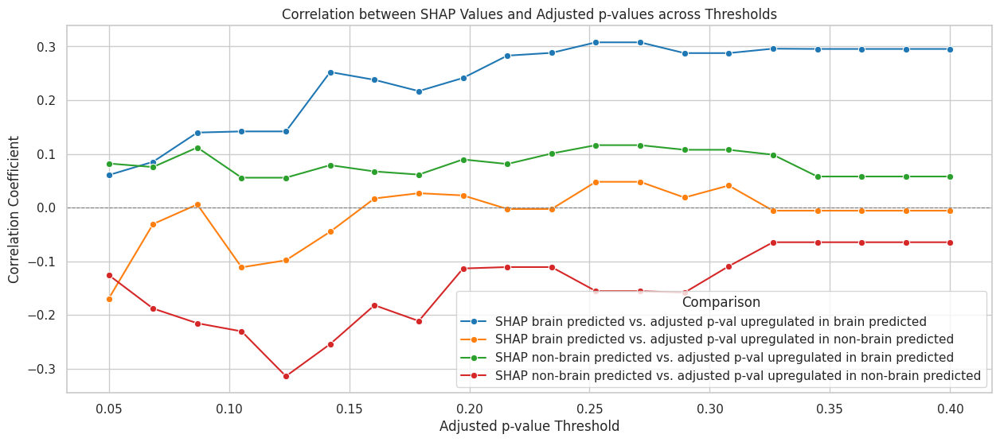

In [16]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define a range of adjusted p-value thresholds
pval_thresholds = np.linspace(0.05, 0.4, 20)  # From 0.05 to 0.5 in 10 steps

# Store correlation results
corr_results = {
    'Threshold': [],
    'Comparison': [],
    'Correlation': []
}

for pval_thresh in pval_thresholds:
    # Filter proteins based on current threshold
    upregulated_notbrain = df[(df['sample_typenot_brain.logFC'] > 1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()
    upregulated_brain = df[(df['sample_typenot_brain.logFC'] < -1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()

    # Map to protein names
    upregulated_notbrain['protein'] = upregulated_notbrain['Protein.Groups'].map(translated_genes)
    upregulated_brain['protein'] = upregulated_brain['Protein.Groups'].map(translated_genes)

    # Keep only relevant columns
    upregulated_notbrain = upregulated_notbrain[['protein', 'sample_typenot_brain.adjPval']]
    upregulated_brain = upregulated_brain[['protein', 'sample_typenot_brain.adjPval']]

    # Set protein as index and merge duplicates by averaging
    upregulated_brain = upregulated_brain.set_index('protein').groupby(level=0).mean().T
    upregulated_notbrain = upregulated_notbrain.set_index('protein').groupby(level=0).mean().T

    # Merge with SHAP values
    comparison_df = shap_df.T.merge(upregulated_brain.T, left_index=True, right_index=True, how='outer')
    comparison_df = comparison_df.merge(upregulated_notbrain.T, left_index=True, right_index=True, how='outer')
    comparison_df['log_adj_pval_upregulatedinbrain'] = -np.log10(comparison_df['adj_pval_upregulatedinbrain'] + 1e-10)
    comparison_df['log_adj_pval_upregulatedinnotbrain'] = -np.log10(comparison_df['adj_pval_upregulatedinnotbrain'] + 1e-10)

    comparison_df = comparison_df.fillna(np.nan)
    corr_matrix = comparison_df.corr(method='spearman')
    
    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP brain predicted vs. log adjusted p-val upregulated in brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_brainpredicted', 'log_adj_pval_upregulatedinbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP brain predicted vs. log adjusted p-val upregulated in non-brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_brainpredicted', 'log_adj_pval_upregulatedinnotbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP non-brain predicted vs. log adjusted p-val upregulated in brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_notbrainpredicted', 'log_adj_pval_upregulatedinbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP non-brain predicted vs. log adjusted p-val upregulated in non-brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_notbrainpredicted', 'log_adj_pval_upregulatedinnotbrain'])

# Convert to DataFrame
corr_df = pd.DataFrame(corr_results)
# Plot the correlation trend for each comparison
plt.figure(figsize=(15, 6))
f = sns.lineplot(data=corr_df, x='Threshold', y='Correlation', hue='Comparison', marker='o', palette="tab10")
plt.xlabel('Adjusted p-value Threshold')
plt.ylabel('Correlation Coefficient')
plt.title('Correlation between SHAP Values and Adjusted p-values across Thresholds')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)  # Add a horizontal line at 0
plt.grid(True)
# plt.legend(title="Comparison", bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=2)
plt.show()
f.figure.savefig("/home/compomics/git/Projects/MLMarker_paper/Figures_paper/melanoma_correlation_shap_adjpval.png", dpi=800,bbox_inches='tight')

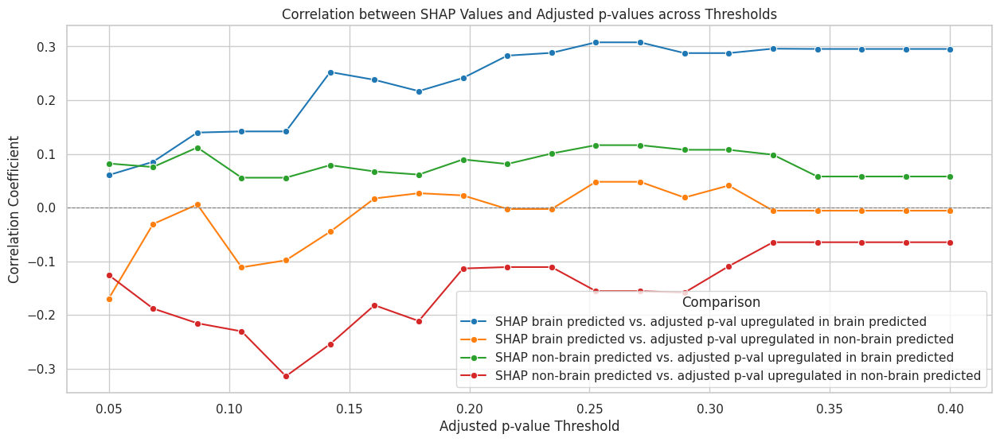

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Define a range of adjusted p-value thresholds
pval_thresholds = np.linspace(0.05, 0.4, 20)  # From 0.05 to 0.5 in 10 steps

# Store correlation results
corr_results = {
    'Threshold': [],
    'Comparison': [],
    'Correlation': []
}

for pval_thresh in pval_thresholds:
    # Filter proteins based on current threshold
    upregulated_notbrain = df[(df['sample_typenot_brain.logFC'] > 1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()
    upregulated_brain = df[(df['sample_typenot_brain.logFC'] < -1) & (df['sample_typenot_brain.adjPval'] <= pval_thresh)].reset_index()

    # Map to protein names
    upregulated_notbrain['protein'] = upregulated_notbrain['Protein.Groups'].map(translated_genes)
    upregulated_brain['protein'] = upregulated_brain['Protein.Groups'].map(translated_genes)

    # Keep only relevant columns
    upregulated_notbrain = upregulated_notbrain[['protein', 'sample_typenot_brain.adjPval']]
    upregulated_brain = upregulated_brain[['protein', 'sample_typenot_brain.adjPval']]

    # Set protein as index and merge duplicates by averaging
    upregulated_brain = upregulated_brain.set_index('protein').groupby(level=0).mean().T
    upregulated_notbrain = upregulated_notbrain.set_index('protein').groupby(level=0).mean().T

    # Merge with SHAP values
    comparison_df = shap_df.T.merge(upregulated_brain.T, left_index=True, right_index=True, how='outer')
    comparison_df = comparison_df.merge(upregulated_notbrain.T, left_index=True, right_index=True, how='outer')
    comparison_df.columns = ['SHAP_brainpredicted', 'SHAP_notbrainpredicted', 'adj_pval_upregulatedinbrain', 'adj_pval_upregulatedinnotbrain']
    comparison_df = comparison_df.fillna(np.nan)

    # Compute and store correlations
    corr_matrix = comparison_df.corr(method='spearman')
    
    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP brain predicted vs. adjusted p-val upregulated in brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_brainpredicted', 'adj_pval_upregulatedinbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP brain predicted vs. adjusted p-val upregulated in non-brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_brainpredicted', 'adj_pval_upregulatedinnotbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP non-brain predicted vs. adjusted p-val upregulated in brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_notbrainpredicted', 'adj_pval_upregulatedinbrain'])

    corr_results['Threshold'].append(pval_thresh)
    corr_results['Comparison'].append('SHAP non-brain predicted vs. adjusted p-val upregulated in non-brain predicted')
    corr_results['Correlation'].append(corr_matrix.loc['SHAP_notbrainpredicted', 'adj_pval_upregulatedinnotbrain'])

# Convert to DataFrame
corr_df = pd.DataFrame(corr_results)
# Plot the correlation trend for each comparison
plt.figure(figsize=(15, 6))
f = sns.lineplot(data=corr_df, x='Threshold', y='Correlation', hue='Comparison', marker='o', palette="tab10")
plt.xlabel('Adjusted p-value Threshold')
plt.ylabel('Correlation Coefficient')
plt.title('Correlation between SHAP Values and Adjusted p-values across Thresholds')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)  # Add a horizontal line at 0
plt.grid(True)
# plt.legend(title="Comparison", bbox_to_anchor=(0.5, -0.2), loc='upper center', ncol=2)
plt.show()
f.figure.savefig("/home/compomics/git/Projects/MLMarker_paper/Figures_paper/melanoma_correlation_shap_adjpval.png", dpi=800,bbox_inches='tight')

In [40]:
corr_df[corr_df["Comparison"] == "SHAP non-brain predicted vs. adjusted p-val upregulated in non-brain predicted"]

,Threshold,Comparison,Correlation
3,0.050000,SHAP non-brain predicted vs. adjusted p-val up...,-0.125618
7,0.068421,SHAP non-brain predicted vs. adjusted p-val up...,-0.187841
11,0.086842,SHAP non-brain predicted vs. adjusted p-val up...,-0.215287
15,0.105263,SHAP non-brain predicted vs. adjusted p-val up...,-0.230387
19,0.123684,SHAP non-brain predicted vs. adjusted p-val up...,-0.313934
23,0.142105,SHAP non-brain predicted vs. adjusted p-val up...,-0.254085
27,0.160526,SHAP non-brain predicted vs. adjusted p-val up...,-0.181723
31,0.178947,SHAP non-brain predicted vs. adjusted p-val up...,-0.211141
35,0.197368,SHAP non-brain predicted vs. adjusted p-val up...,-0.113378
39,0.215789,SHAP non-brain predicted vs. adjusted p-val up...,-0.110726


# Figures

In [11]:
df = pd.read_csv("/home/compomics/git/Projects/MLMarker_paper/PXD007592_responders_melanoma/prediction_volcano_data_sample_typenot_brain.csv")
df['protein'] = df['Protein.Groups'].map(translated_genes)
df = df.groupby('protein').agg({"logFC":'mean',	"pval":'mean',	"adjPval":'mean'}).reset_index()
df['in_mlmarker'] = df['protein'].isin(features)
df.dropna(how='all', inplace=True)

df.fillna(0, inplace=True)
# df.to_csv('/home/compomics/git/Projects/MLMarker_paper/PXD007592_responders_melanoma/prediction_volcano_data_sample_typenot_bra
# indication.csv')
df.head()

,protein,logFC,pval,adjPval,in_mlmarker
0,A0A075B6H7,0.623481,0.554880,0.716580,True
1,A0A0C4DH25,-0.498462,0.613067,0.757622,True
2,A0A0C4DH38,-0.451811,0.641695,0.780452,True
3,A0AVT1,-0.334773,0.084838,0.225983,True
4,A0FGR8,-0.177659,0.354468,0.534578,False


In [14]:
pxd = "PXD007592"
base_path = f"/home/compomics/conode*/PRIDE_DATA"  
lengths_path = "/home/compomics/git/Projects/MLMarker_paper/uniprot_reviewed_lengths.tsv"
prot_mlmarker_df, unique_protein_dict = get_mlmarker_dataframe(pxd, base_path, lengths_path, dev=True, tissue_level=False)
prot_mlmarker_df['disease_status'] = prot_mlmarker_df['filename'].str.split('_').str[0]
metadata = pd.read_csv('metadata.csv')
metadata['file'] = metadata['Filename'].str.split(' ').str[1]
#map Predicted from metadata to new column in prot_mlmarker_df based on filename
prot_mlmarker_df['Predicted'] = prot_mlmarker_df['filename'].map(metadata.set_index('file')['Predicted'])
shap_df = prot_mlmarker_df.reset_index()[['index', 'Brain', 'filename', 'Predicted']].pivot_table(index=['Predicted'], columns='index', values='Brain', aggfunc='mean')

Trying to unpickle estimator DecisionTreeClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator DecisionTreeClassifier from version 1.5.1 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestClassifier from version 1.5.1 when using version 1.6.1. This might lead to

KeyError: "['Predicted'] not in index"

In [15]:
metadata = pd.read_csv('metadata.csv')
metadata['file'] = metadata['Filename'].str.split(' ').str[1]
#map Predicted from metadata to new column in prot_mlmarker_df based on filename
prot_mlmarker_df['Predicted'] = prot_mlmarker_df['filename'].map(metadata.set_index('file')['Predicted'])
shap_df = prot_mlmarker_df.reset_index()[['index', 'Brain', 'filename', 'Predicted']].pivot_table(index=['Predicted'], columns='index', values='Brain', aggfunc='mean')

[(0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961)]

0.09657412325478058 0.04095915346655173


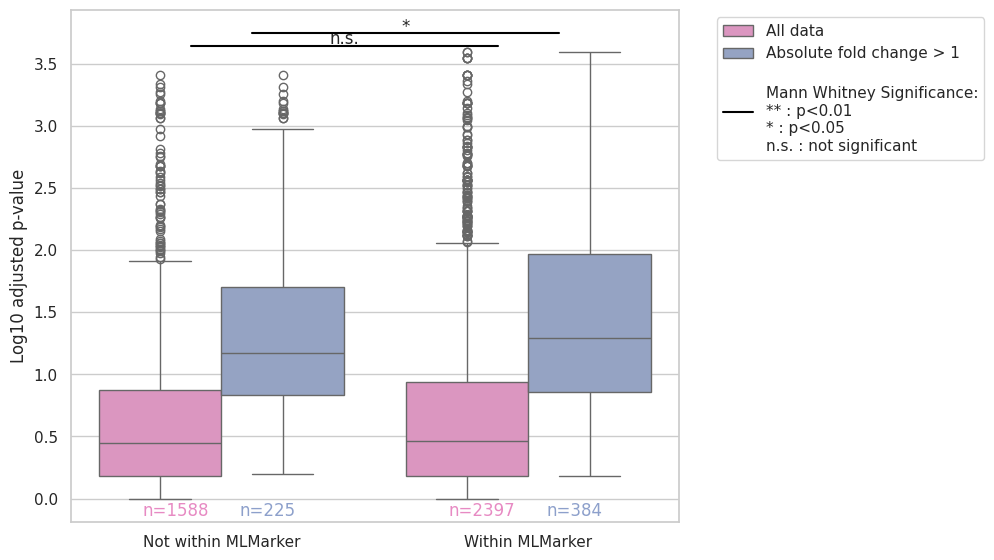

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import mannwhitneyu

df['log_adjpval'] = -np.log10(df['adjPval'] + 1e-10)  

# Subset based on logFC
sig_df = df[(abs(df['logFC']) > 1) | (df['logFC'] < -1)].copy()

# Add source labels
df['source'] = 'All data'
sig_df['source'] = 'Absolute fold change > 1'

# Combine
combined_df = pd.concat([df, sig_df])

# Plot
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x='in_mlmarker', y='log_adjpval', data=combined_df, hue='source', palette=sns.color_palette("Set2")[2:4][::-1])

# Labels and ticks
plt.ylabel('Log10 adjusted p-value')
plt.xticks([0, 1], ['Not within MLMarker', 'Within MLMarker'])


# Counts
for i in [False, True]:
    count_all = df[df['in_mlmarker']==i].shape[0]
    count_sig = sig_df[sig_df['in_mlmarker']==i].shape[0]
    plt.text(i - 0.15, -0.17, f"n={count_all}", ha='center', va='bottom', color=sns.color_palette("Set2")[3])
    plt.text(i + 0.15, -0.17, f"n={count_sig}", ha='center', va='bottom', color=sns.color_palette("Set2")[2])

# Define p-value to star conversion
def pval_to_star(p):
    if p < 0.0001: return '****'
    elif p < 0.001: return '***'
    elif p < 0.01: return '**'
    elif p < 0.05: return '*'
    else: return 'n.s.'

# Statistical comparison: All Data
all_0 = df[df['in_mlmarker'] == 0]['log_adjpval']
all_1 = df[df['in_mlmarker'] == 1]['log_adjpval']
p_all = mannwhitneyu(all_0, all_1, alternative='two-sided').pvalue

# Statistical comparison: Significant Data
sig_0 = sig_df[sig_df['in_mlmarker'] == 0]['log_adjpval']
sig_1 = sig_df[sig_df['in_mlmarker'] == 1]['log_adjpval']
p_sig = mannwhitneyu(sig_0, sig_1, alternative='two-sided').pvalue
print(p_all, p_sig)

# Find Y-axis positions for annotations
y_all = combined_df[combined_df['source'] == 'All data']['log_adjpval'].max() + 0.05
y_sig = combined_df[combined_df['source'] == 'Absolute fold change > 1']['log_adjpval'].max() + 0.15

# Annotate All Data comparison
ax.plot([0 - 0.1, 1 - 0.1], [y_all, y_all], lw=1.5, color='black')
ax.text(0.5 - 0.1, y_all + 0.01, pval_to_star(p_all), ha='center')

# Annotate Significant Data comparison
ax.plot([0 + 0.1, 1 + 0.1], [y_sig, y_sig], lw=1.5, color='black')
ax.text(0.5 + 0.1, y_sig + 0.01, pval_to_star(p_sig), ha='center')

plt.legend(bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
from matplotlib.lines import Line2D

star_legend = Line2D([0], [0], color='black', lw=1.5, label='\nMann Whitney Significance:\n' +
                     '** : p<0.01\n' +
                     '* : p<0.05\n' +
                     'n.s. : not significant')

handles, labels = ax.get_legend_handles_labels()
handles.append(star_legend)
labels.append('')
#hide x-axis label
plt.xlabel('')
plt.legend(handles=handles, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.savefig("/home/compomics/git/Projects/MLMarker_paper/Figures_paper/mlmarker_sign_boxplot.png", dpi=800, bbox_inches='tight')
plt.show()


In [17]:
subset_df = combined_df[(combined_df['in_mlmarker']==True)&(combined_df['source']=="Absolute fold change > 1")]
subset_df = subset_df.set_index('protein').merge(shap_df.T, left_on='protein', right_on='index')
subset_df = subset_df[subset_df['brain'].notnull() | subset_df['not_brain'].notnull()]
subset_df['max_shap_abs'] = subset_df[["brain","not_brain"]].abs().max(axis=1)
epsilon = 1e-10  # small constant to avoid division by zero
subset_df['log_max_shap_abs'] = -np.log10(subset_df['max_shap_abs'] + epsilon)
subset_df

,logFC,pval,adjPval,in_mlmarker,log_adjpval,source,brain,not_brain,max_shap_abs,log_max_shap_abs
0,-1.424289,0.001674,0.020326,True,1.691958,Absolute fold change > 1,0.000000,0.000000,0.000000,10.000000
1,-1.243765,0.000042,0.002044,True,2.689499,Absolute fold change > 1,0.000000,0.000000,0.000000,10.000000
2,1.083275,0.047403,0.159691,True,0.796720,Absolute fold change > 1,0.000000,0.000000,0.000000,10.000000
3,-1.145812,0.276913,0.459841,True,0.337392,Absolute fold change > 1,0.000000,0.000000,0.000000,10.000000
4,-1.014237,0.015255,0.079983,True,1.097001,Absolute fold change > 1,0.000000,0.000000,0.000000,10.000000
...,...,...,...,...,...,...,...,...,...,...
379,-1.021033,0.023477,0.101498,True,0.993541,Absolute fold change > 1,0.000084,0.000000,0.000084,4.074859
380,-1.137168,0.045210,0.154522,True,0.811009,Absolute fold change > 1,0.000000,0.000000,0.000000,10.000000
381,1.612970,0.005451,0.043328,True,1.363235,Absolute fold change > 1,-0.000112,-0.000037,0.000112,3.950459
382,-1.308566,0.014634,0.078005,True,1.107879,Absolute fold change > 1,0.000000,0.000000,0.000000,10.000000


(384, 10)


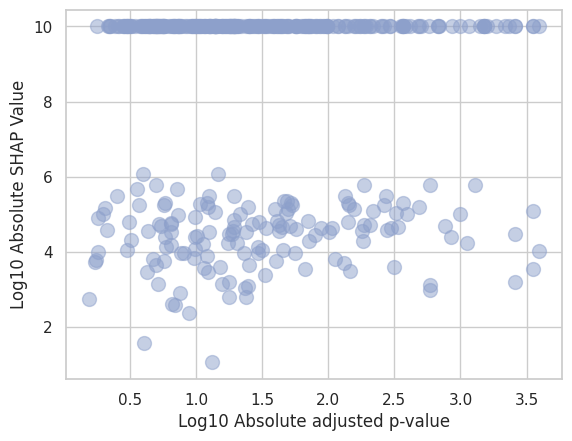

Spearman rho = 0.004, p = 0.938
Kendall's tau = 0.005, p-value = 0.903
Pearson correlation coefficient = 0.018, p-value = 0.72


In [20]:
# plot_comparison = subset_df[(subset_df['max_shap_abs']!= 0.0)&(~subset_df['log_adjpval'].isnull())]
plot_comparison = subset_df

print(plot_comparison.shape)
plt.scatter(y=plot_comparison['log_max_shap_abs'], x=plot_comparison['log_adjpval'], alpha=0.5, s=100,  color=sns.color_palette("Set2")[2])

# sns.regplot(x='log_adjpval', y='log_max_shap_abs', data=plot_comparison, scatter=False, fit_reg=True, color='red', line_kws={'linestyle': '--'})
plt.xlabel('Log10 Absolute adjusted p-value')
plt.ylabel('Log10 Absolute SHAP Value')
# plt.xlim(0,4)
# plt.ylim(0,7)
plt.show()



from scipy.stats import spearmanr
rho, pval = spearmanr(plot_comparison['log_adjpval'], plot_comparison['log_max_shap_abs'])
print(f"Spearman rho = {rho:.3f}, p = {pval:.3g}")

#calculate kendalls tau
from scipy.stats import kendalltau
tau, pval = kendalltau(plot_comparison['log_adjpval'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Kendall's tau = {tau:.3f}, p-value = {pval:.3g}")
#pearson correlation
from scipy.stats import pearsonr
pearson_corr, pearson_pval = pearsonr(plot_comparison['log_adjpval'], np.log10(plot_comparison['log_max_shap_abs']))
print(f"Pearson correlation coefficient = {pearson_corr:.3f}, p-value = {pearson_pval:.3g}")
